In [1]:
import pandas as pd
import plotly.express as px
from pathlib import Path

# ============================
# CARREGAR TODOS OS CSVs
# ============================

results_path = Path("")

csv_files = list(results_path.glob("*.csv"))

if not csv_files:
    raise FileNotFoundError("Nenhum CSV encontrado na pasta ../results")

dfs = []
for csv in csv_files:
    df_tmp = pd.read_csv(csv)
    df_tmp["source_file"] = csv.name  # opcional: rastrear origem
    dfs.append(df_tmp)

df = pd.concat(dfs, ignore_index=True)

# 🔧 garantir que erro é numérico
df["erro"] = pd.to_numeric(df["erro"], errors="coerce")

# ============================
# ORDENAR MODELOS
# ============================

order = (
    df.groupby("modelo")["erro"]
    .median()
    .sort_values()
    .index
    .tolist()
)

# ============================
# MAPA DE CORES
# ============================

color_map = {
    "baseline_ultra":  "#EF553B",
    "shape_ultra":  "#EF553B",
    "tail_ultra":  "#EF553B",
    "divergence_ultra": "#EF553B",
    "qderiv_ultra": "#EF553B",
    "baseline_tails_01": "#EF553B",
    "DyS_hellinger": "#fc03d3",
    "DyS_topsoe": "#fc03d3",
    "QuaDapt_DyS": "#fc03d3",
    "baseline_lite": "#19D3F3",
    "mfe": "#19D3F3",
    "qderiv_lite": "#19D3F3",
    "MiniRocket": "#19D3F3",
    "tsfresh": "#19D3F3",
    "catch22": "#19D3F3",
    "divergence_lite": "#19D3F3",
    "tail_lite": "#19D3F3",
    "shape_lite": "#19D3F3"
}

# ============================
# PLOT
# ============================

fig = px.box(
    df,
    x="modelo",
    y="erro",
    category_orders={"modelo": order},
    points="all",
    color="modelo",
    color_discrete_map=color_map
)

fig.update_traces(
    jitter=0.35,
    marker=dict(size=4, opacity=0.6),
)

fig.update_layout(
    title="Comparação de erro entre modelos (ordenado do melhor ao pior)",
    xaxis_title="Modelo",
    yaxis_title="Erro absoluto |prev_pred − prev_real|",
    template="simple_white",
    width=950,
    height=450,
    showlegend=True
)

fig

In [2]:
import pandas as pd
import plotly.express as px
from pathlib import Path

# ============================
# CARREGAR TODOS OS CSVs
# ============================

results_path = Path("")

csv_files = list(results_path.glob("*.csv"))

if not csv_files:
    raise FileNotFoundError(
        "Nenhum CSV encontrado"
    )

dfs = []

for csv in csv_files:

    df_tmp = pd.read_csv(csv)

    df_tmp["source_file"] = csv.name

    dfs.append(df_tmp)

df = pd.concat(dfs, ignore_index=True)

# ============================
# LIMPEZA
# ============================

df["erro"] = pd.to_numeric(
    df["erro"],
    errors="coerce"
)

# ============================
# AGRUPAR TODOS OS MOSS
# ============================

df["grupo_modelo"] = df["modelo"]

df.loc[
    df["modelo"].str.contains(
        "MoSS",
        case=False,
        na=False
    ),
    "grupo_modelo"
] = "MoSS"

# ============================
# ORDEM DOS GRUPOS
# ============================

order = (
    df.groupby("grupo_modelo")["erro"]
    .median()
    .sort_values()
    .index
    .tolist()
)

# ============================
# CORES
# ============================

color_map = {
    "MoSS": "#19D3F3",
    "EMQ_BCTS": "#EF553B",
    "ClusterQuant": "#AB63FA"
}

# ============================
# PLOT
# ============================

fig = px.box(
    df,
    x="grupo_modelo",
    y="erro",
    color="grupo_modelo",
    category_orders={
        "grupo_modelo": order
    },
    color_discrete_map=color_map,
    points="all"
)

fig.update_traces(
    jitter=0.35,
    marker=dict(
        size=4,
        opacity=0.5
    )
)

fig.update_layout(
    title=(
        "Comparação entre grupos de modelos"
    ),
    xaxis_title="Grupo",
    yaxis_title=(
        "Erro absoluto |prev_pred − prev_real|"
    ),
    template="simple_white",
    width=900,
    height=500,
    showlegend=False
)

fig.show()

# ============================
# SALVAR HTML
# ============================

#fig.write_html(
#    "comparacao_grupos.html"
#)

print(
    "✅ HTML salvo em comparacao_grupos.html"
)

✅ HTML salvo em comparacao_grupos.html


In [3]:
# ============================
# TABELA DE MEDIANAS
# ============================

tabela_mediana = (
    df.groupby(
        ["dataset", "grupo_modelo"]
    )["erro"]
    .median()
    .reset_index()
)

# pivotar para ficar bonito
tabela_mediana = tabela_mediana.pivot(
    index="dataset",
    columns="grupo_modelo",
    values="erro"
)

# ordenar datasets pela melhor mediana do MoSS
if "MoSS" in tabela_mediana.columns:
    tabela_mediana = tabela_mediana.sort_values(
        by="MoSS"
    )

print("\n===== MEDIANA POR DATASET =====\n")

print(
    tabela_mediana.round(4)
)

# salvar CSV
#tabela_mediana.to_csv(
#    "medianas_por_dataset.csv"
#)

print(
    "\n✅ Tabela salva em medianas_por_dataset.csv"
)


===== MEDIANA POR DATASET =====

grupo_modelo          AC      CC     EMQ  EMQ_BCTS      FM  KDEyCS  KDEyHD  \
dataset                                                                      
letter            0.0022  0.0022  0.0038    0.0041  0.0187  0.0037  0.0041   
isolet            0.0027  0.0028  0.0077    0.0083  0.0246  0.0031  0.0039   
chess             0.0147  0.0195  0.0109    0.0116  0.0367  0.0113  0.0130   
digits            0.0023  0.0024  0.0096    0.0106  0.0230  0.0052  0.0048   
hand_digits       0.0017  0.0016  0.0036    0.0039  0.0129  0.0038  0.0038   
obesity           0.0060  0.0080  0.0167    0.0190  0.0414  0.0096  0.0072   
dry-bean          0.0053  0.0080  0.0046    0.0047  0.0159  0.0060  0.0052   
image_seg         0.0047  0.0034  0.0040    0.0042  0.0173  0.0036  0.0059   
abalone           0.0989  0.0687  0.0586    0.0567  0.1046  0.0623  0.0647   
nursery           0.0090  0.0370  0.0230    0.0245  0.0755  0.0053  0.0042   
mhr               0.0393  0.03

In [4]:
import pandas as pd
import plotly.express as px

# =========================================================
# LOAD
# =========================================================
results_path = Path("")

csv_files = list(results_path.glob("*.csv"))

if not csv_files:
    raise FileNotFoundError("Nenhum CSV encontrado na pasta ../results")

dfs = []
for csv in csv_files:
    df_tmp = pd.read_csv(csv)
    df_tmp["source_file"] = csv.name  # opcional: rastrear origem
    dfs.append(df_tmp)

df = pd.concat(dfs, ignore_index=True)

# 🔧 garantir que erro é numérico
df["erro"] = pd.to_numeric(df["erro"], errors="coerce")

# =========================================================
# AGREGAÇÃO (modelo × dataset)
# 👉 troque mean por median se quiser
# =========================================================
df_agg = (
    df
    .groupby(["modelo", "dataset"], as_index=False)
    .agg(erro_mean=("erro", "mean"))
)

# =========================================================
# ORDEM DOS MODELOS (melhor → pior)
# =========================================================
order = (
    df_agg
    .groupby("modelo")["erro_mean"]
    .median()
    .sort_values()
    .index
    .tolist()
)


# =========================================================
# LINEPLOT
# =========================================================
fig = px.line(
    df_agg,
    x="dataset",
    y="erro_mean",
    color="modelo",
    category_orders={"modelo": order},
    markers=True
)

fig.update_layout(
    title="Erro médio por dataset (lineplot)",
    xaxis_title="Dataset",
    yaxis_title="Erro médio |prev_pred − prev_real|",
    template="simple_white",
    width=1100,
    height=500,
)

fig.update_traces(
    marker=dict(size=6),
    line=dict(width=2)
)

fig


===== CSV LOADED =====
    dataset    modelo  n_classes_original      erro
0  dry-bean       EMQ                   7  0.004477
1  dry-bean  EMQ_BCTS                   7  0.004495
2  dry-bean        CC                   7  0.007429
3  dry-bean       PCC                   7  0.010558
4  dry-bean        AC                   7  0.005977

===== MODELOS RESTANTES =====
['AC', 'CC', 'EMQ', 'EMQ_BCTS', 'FM', 'KDEyCS', 'KDEyHD', 'KDEyML', 'PAC', 'PCC', 'PWK', 'QMOSS', 'QMOSS_CALIBRATED', 'QMOSS_HYBRID']

===== AVERAGE RANK =====
              modelo  rank_dataset
0             KDEyML      3.125000
1             KDEyHD      4.291667
2             KDEyCS      4.416667
3                EMQ      5.291667
4                PAC      5.375000
5                 AC      5.937500
6           EMQ_BCTS      6.250000
7                PWK      8.125000
8                 CC      8.229167
9       QMOSS_HYBRID      9.791667
10               PCC     10.125000
11  QMOSS_CALIBRATED     10.416667
12                

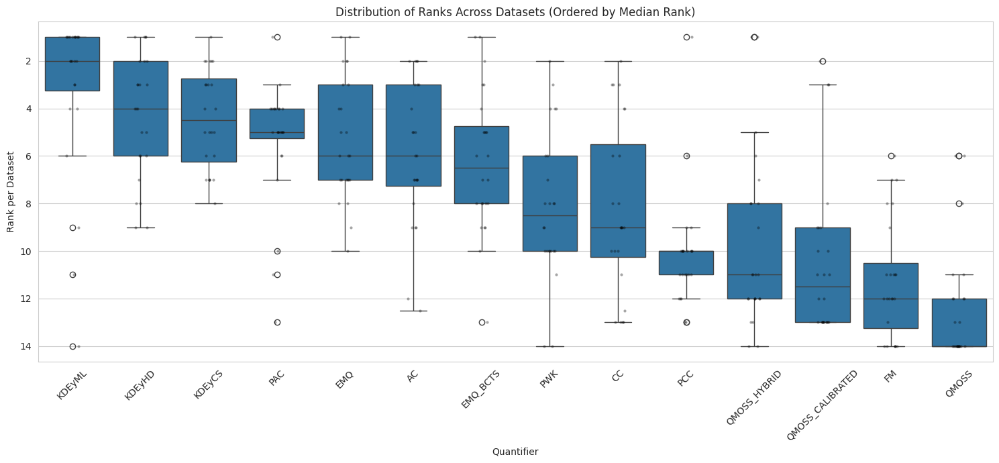

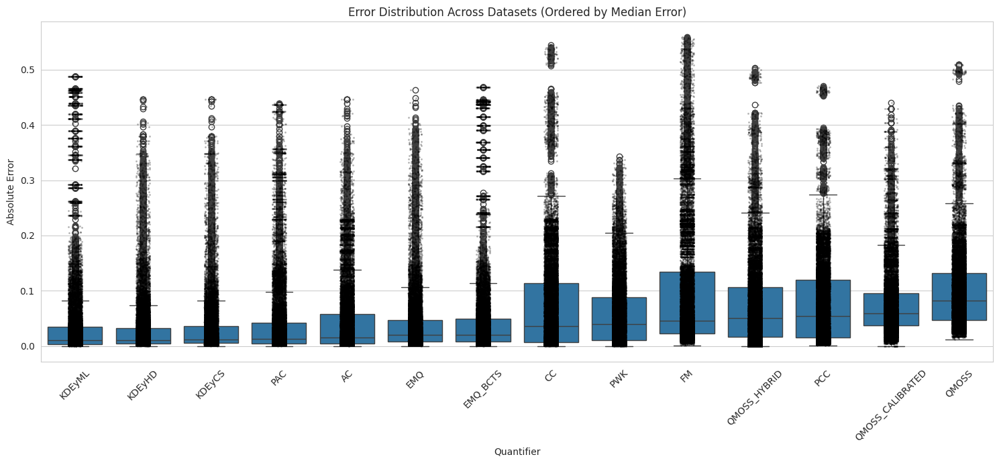


===== GLOBAL MEAN ERROR =====
              modelo  mean_error
0             KDEyHD    0.029526
1             KDEyCS    0.029987
2                EMQ    0.038352
3                PAC    0.038912
4             KDEyML    0.039477
5                 AC    0.043726
6           EMQ_BCTS    0.045657
7                PWK    0.058062
8                 CC    0.070813
9       QMOSS_HYBRID    0.072150
10  QMOSS_CALIBRATED    0.075239
11               PCC    0.075917
12             QMOSS    0.098327
13                FM    0.099331

===== GLOBAL MEDIAN ERROR =====
              modelo  median_error
0             KDEyML      0.010132
1             KDEyHD      0.010999
2             KDEyCS      0.012285
3                PAC      0.013601
4                 AC      0.015794
5                EMQ      0.019807
6           EMQ_BCTS      0.020010
7                 CC      0.036000
8                PWK      0.040000
9                 FM      0.045691
10      QMOSS_HYBRID      0.050857
11               PCC 

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ============================================================
# CONFIG
# ============================================================

CSV_PATH = "exp_results.csv"

# ============================================================
# STYLE
# ============================================================

sns.set_style("whitegrid")

# ============================================================
# LOAD CSV
# ============================================================

df = pd.read_csv(CSV_PATH)

print("\n===== CSV LOADED =====")
print(df.head())

# ============================================================
# UNIFICAR TODOS OS QMOSS
# ============================================================

df["modelo"] = df["modelo"].replace(
    {
        r"QMOSS_\d+_HYBRID": "QMOSS_HYBRID",
        r"QMOSS_\d+_CALIBRATED": "QMOSS_CALIBRATED",
        r"QMOSS_\d+$": "QMOSS",

        r"MoSS_\d+_CALIBRATED": "MoSS_CALIBRATED"
    },
    regex=True
)

# ============================================================
# REMOVER MODELOS ESPECÍFICOS
# ============================================================

modelos_remover = [
    #"KDEyHD",
    #"KDEyCS",
    #"EMQ_BCTS",
    "ClusterQuant"
]

df = df[~df["modelo"].isin(modelos_remover)]

print("\n===== MODELOS RESTANTES =====")
print(sorted(df["modelo"].unique()))

# ============================================================
# MÉDIA POR DATASET
# ============================================================

dataset_mean = (
    df.groupby(["dataset", "modelo"])["erro"]
    .mean()
    .reset_index()
)

# ============================================================
# RANK DENTRO DE CADA DATASET
# ============================================================

dataset_mean["rank_dataset"] = (
    dataset_mean.groupby("dataset")["erro"]
    .rank(method="average")
)

# ============================================================
# AVERAGE RANK FINAL
# ============================================================

avg_rank = (
    dataset_mean.groupby("modelo")["rank_dataset"]
    .mean()
    .sort_values()
    .reset_index()
)

print("\n===== AVERAGE RANK =====")
print(avg_rank)

# ============================================================
# SALVAR AVG RANK
# ============================================================

avg_rank.to_csv(
    "average_rank_filtered.csv",
    index=False
)

# ============================================================
# ORDEM PELA MEDIANA DOS RANKS
# ============================================================

ordem_rank = (
    dataset_mean.groupby("modelo")["rank_dataset"]
    .median()
    .sort_values()
    .index
)

# ============================================================
# BOXPLOT DOS RANKS
# ============================================================

plt.figure(figsize=(15, 7))

sns.boxplot(
    data=dataset_mean,
    x="modelo",
    y="rank_dataset",
    order=ordem_rank
)

sns.stripplot(
    data=dataset_mean,
    x="modelo",
    y="rank_dataset",
    order=ordem_rank,
    color="black",
    alpha=0.35,
    size=3
)

plt.xticks(rotation=45)

plt.xlabel("Quantifier")
plt.ylabel("Rank per Dataset")

plt.title(
    "Distribution of Ranks Across Datasets "
    "(Ordered by Median Rank)"
)

# rank menor = melhor
plt.gca().invert_yaxis()

plt.tight_layout()

#plt.savefig(
#    "rank_boxplot_filtered.png",
#    dpi=300,
#    bbox_inches="tight"
#)

plt.show()

# ============================================================
# ORDEM PELA MEDIANA DOS ERROS
# ============================================================

ordem_erro = (
    df.groupby("modelo")["erro"]
    .median()
    .sort_values()
    .index
)

# ============================================================
# BOXPLOT DOS ERROS
# ============================================================

plt.figure(figsize=(15, 7))

sns.boxplot(
    data=df,
    x="modelo",
    y="erro",
    order=ordem_erro
)

sns.stripplot(
    data=df,
    x="modelo",
    y="erro",
    order=ordem_erro,
    color="black",
    alpha=0.30,
    size=2
)

plt.xticks(rotation=45)

plt.xlabel("Quantifier")
plt.ylabel("Absolute Error")

plt.title(
    "Error Distribution Across Datasets "
    "(Ordered by Median Error)"
)

plt.tight_layout()

#plt.savefig(
#    "error_boxplot_filtered.png",
#    dpi=300,
#    bbox_inches="tight"
#)

plt.show()

# ============================================================
# MELHOR MODELO GLOBAL RESTANTE
# ============================================================

global_mean_error = (
    df.groupby("modelo")["erro"]
    .mean()
    .sort_values()
    .reset_index()
)

global_mean_error.columns = [
    "modelo",
    "mean_error"
]

print("\n===== GLOBAL MEAN ERROR =====")
print(global_mean_error)

# ============================================================
# MEDIANA GLOBAL DOS ERROS
# ============================================================

global_median_error = (
    df.groupby("modelo")["erro"]
    .median()
    .sort_values()
    .reset_index()
)

global_median_error.columns = [
    "modelo",
    "median_error"
]

print("\n===== GLOBAL MEDIAN ERROR =====")
print(global_median_error)

# ============================================================
# SALVAR RESULTADOS
# ============================================================

#global_mean_error.to_csv(
#    "global_mean_error_filtered.csv",
#    index=False
#)

#global_median_error.to_csv(
#    "global_median_error_filtered.csv",
#    index=False
#)

# ============================================================
# RESUMO FINAL
# ============================================================

print("\n✅ ANALYSIS FINISHED")

print("\nArquivos gerados:")

print(" - average_rank_filtered.csv")
print(" - global_mean_error_filtered.csv")
print(" - global_median_error_filtered.csv")

print(" - rank_boxplot_filtered.png")
print(" - error_boxplot_filtered.png")

In [7]:
# ============================================================
# TABELA COMPLETA DE RANKS POR DATASET
# ============================================================

rank_table = dataset_mean.pivot(
    index="dataset",
    columns="modelo",
    values="rank_dataset"
)

rank_table.to_csv(
    "rank_per_dataset_table.csv"
)

print("\n===== RANK TABLE =====")
print(rank_table)


===== RANK TABLE =====
modelo              AC    CC   EMQ  EMQ_BCTS    FM  KDEyCS  KDEyHD  KDEyML  \
dataset                                                                      
abalone           12.0  10.0   5.0       4.0  14.0     7.0     9.0    11.0   
academic-success   5.0  13.0   7.0       8.0  14.0     1.0     2.0     3.0   
chess              7.0   8.0   2.0       5.0  12.0     3.0     6.0     1.0   
cmc                7.0  11.0   3.0       5.0  14.0     6.0     1.0     2.0   
connect-4          7.0  13.0   5.0       6.0  14.0     2.0     1.0     4.0   
digits             2.0   3.0   8.0       9.0  11.0     7.0     6.0     1.0   
dry-bean           6.0   9.0   2.0       3.0  11.0     7.0     5.0     1.0   
hand_digits        2.0   3.0   6.0       9.0  11.0     7.0     8.0     1.0   
hcv                9.0   4.0  10.0      13.0  12.0     8.0     7.0    14.0   
image_seg          7.0   6.0   4.0       5.0  11.0     3.0     8.0     2.0   
isolet             2.0   3.0   8.0      

In [9]:
# ============================================================
# CHECAR EMPATES NOS RANKINGS
# ============================================================

print("\n===== CHECKING RANK TIES =====")

ties_found = False

for dataset_name, group in dataset_mean.groupby("dataset"):

    # conta quantos erros repetidos existem
    duplicated_errors = group["erro"].duplicated(keep=False)

    if duplicated_errors.any():

        ties_found = True

        print(f"\n⚠️ Empate encontrado no dataset: {dataset_name}")

        tied_rows = group.loc[
            duplicated_errors,
            ["modelo", "erro", "rank_dataset"]
        ].sort_values("erro")

        print(tied_rows.to_string(index=False))

if not ties_found:

    print("✅ Nenhum empate encontrado nos rankings.")


===== CHECKING RANK TIES =====
✅ Nenhum empate encontrado nos rankings.


In [10]:
import pandas as pd

# ============================================================
# LOAD CSV
# ============================================================

df = pd.read_csv("exp_results.csv")

# ============================================================
# TOTAL DE DATASETS
# ============================================================

datasets = sorted(df["dataset"].unique())

print("\n===== DATASETS =====")

for d in datasets:
    print(d)

print("\n====================")
print(f"TOTAL DATASETS: {len(datasets)}")


===== DATASETS =====
abalone
academic-success
chess
cmc
connect-4
digits
dry-bean
hand_digits
hcv
image_seg
isolet
letter
mhr
molecular
nursery
obesity
page_block
phishing
poker_hand
satellite
shuttle
waveform-v1
wine-quality
yeast

TOTAL DATASETS: 24
